In [1]:
from pyau3d.utils import PltFileUtils, GrpFileUtils, UnkFileUtils
import matplotlib.pyplot as plt
from matplotlib.tri import Triangulation
import numpy as np
import pandas as pd
# Enable interactive backend
%matplotlib widget

In [2]:
# Load necessary files
pltfile = PltFileUtils('./cylinder.plt')
rstfile = UnkFileUtils('./cylinder.rst', extend=False) # read file at iteraton = 101

# Compute flow primitives 
rstfile._primitive()

In [3]:
# define required function

def specific_energy(rho, p, ux, uy, uz, gamma=1.4):
    return p / ((gamma - 1.0) * rho) + 0.5 * (ux**2 + uy**2 + uz**2)

def conservative_variables(rst, GAMMA):
    """Return conservative variables U on the surface."""
    E = specific_energy(rst.rho, rst.p, rst.ux, rst.uy, rst.uz, GAMMA)

    U = np.column_stack((
        rst.rho,
        rst.rho * rst.ux,
        rst.rho * rst.uy,
        rst.rho * rst.uz,
        rst.rho * E
    ))
    return U

In [4]:
# define lamdify function to compute jacobian
import sympy as sp
from sympy import *

# Scalars
Vi, g = symbols("V_i gamma")

# Expand Ui, Uj, Aij into scalar symbols
Ui_syms = sp.symbols("Ui0:5")
Uj_syms = sp.symbols("Uj0:5")
Aij_syms = sp.symbols("Aij0:3")

Ui = Matrix(5, 1, Ui_syms)
Uj = Matrix(5, 1, Uj_syms)
Aij = Matrix(3, 1, Aij_syms)

def dot(a, b):
    return (a.T * b)[0]

# Primitive variables
rhoi = Ui[0]
ui = Ui[1:4, 0] / rhoi

rhoj = Uj[0]
uj = Uj[1:4, 0] / rhoj

# Ideal gas
pi = (Ui[4] - rhoi * dot(ui, ui) / 2) / (g - 1)
pj = (Uj[4] - rhoj * dot(uj, uj) / 2) / (g - 1)

# Fluxes
C = dot(rhoi * ui + rhoj * uj, Aij) / 2
M = ((rhoi * ui * ui.T + rhoj * uj * uj.T).T * Aij) / 2
G = (pi + pj) / 2 * Aij
K = dot((Ui[4] + pi) * ui + (Uj[4] + pj) * uj, Aij) / 2

Ri = -Matrix([[C], M + G, [K]]) / Vi

# Jacobian w.r.t. [Ui, Uj]
Uall = Matrix(list(Ui) + list(Uj))
J = simplify(Ri.jacobian(Uall))

# display J

display(J)
# Lambdified function
# input argument ()
J_func = lambdify(
    (*Ui_syms, *Uj_syms, *Aij_syms, Vi, g),
    J,
    modules="numpy"
)

# define a python wrapper for the lambdified function
# J_func_vec means it is a function that accept vector inputs for Ui, Uj and Aij
# input arguments: Ui(5x1), Uj(5x1), Aij(3x1), Vi, gamma
# output : Jacobian matrix [dRi/dUi (5x5), dRi/dUj (5x5)]
def J_func_vec(Ui, Uj, Aij, Vi, gamma):
    return J_func(
        *Ui,
        *Uj,
        *Aij,
        Vi,
        gamma
    )



Matrix([
[                                                                                                                       0,                                                                                                                    -Aij0/(2*V_i),                                                                                                                   -Aij1/(2*V_i),                                                                                                                   -Aij2/(2*V_i),                                                               0,                                                                                                                        0,                                                                                                                    -Aij0/(2*V_i),                                                                                                                   -Aij1/(2*V_i),                                   

In [5]:
# read fort file
fortfile = pd.read_csv('fort.864',delim_whitespace=True, header=None)
fortfile = fortfile.to_numpy()

/tmp/ipykernel_132229/3437458614.py:2: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  fortfile = pd.read_csv('fort.864',delim_whitespace=True, header=None)


In [6]:
# define GAMMA
GAMMA = 1.4
U = conservative_variables(rstfile, GAMMA) # compute conservative variables for n nodes (n, 5) array
i_nodes = fortfile[:,0].astype("i")
j_nodes = fortfile[:,1].astype("i")
A = fortfile[:,2:5]
V = fortfile[:,5]

In [7]:
# trial
indexi = 0
node_i = i_nodes[0]

U_i = U[indexi,:] # U_i conservative variable vector for node i 
neighbours_j = j_nodes[i_nodes == node_i] # neighbours node j 
U_j_all = U[neighbours_j - 1 ,:] # U conservative variable vectors for all neighbouring nodes j (number_of_neighbours , 5)
V_i = V[indexi] # cell volume for node i
A_ij_all = A[i_nodes == node_i, :] # Aij area normal vector for all neighbouring nodes j (number_of_neighbours , 3)

In [10]:
# assembling the jacobian matrix
from scipy.sparse import lil_matrix

# define number of nodes
N = 3060

# initialise the jacobian matrix as a  LIst of Lists sparse matrix (lil_matrix) with size of (5*N, 5*N)
J_matrix = lil_matrix((5*N, 5*N))

# index j is the index from 0 to number of neighbouring nodes

test = list([0])

for indexi in range(N):
    node_i= indexi + 1 # define node i 

    U_i = U[indexi,:] # U_i conservative variable vector for node i 
    neighbours_j = j_nodes[i_nodes == node_i] # neighbours node j 
    U_j_all = U[neighbours_j - 1 ,:] # U conservative variable vectors for all neighbouring nodes j (number_of_neighbours , 5)
    V_i = V[indexi] # cell volume for node i
    A_ij_all = A[i_nodes == node_i, :] # Aij area normal vector for all neighbouring nodes j (number_of_neighbours , 3)
    # print(f"for node {node_i}: ")
    # print("U at node i: ", U_i)
    # print("Aij(s): ",A_ij_all)
    # print("corresponding Vi: ", V_i)

    for indexj in range(len(neighbours_j)):
        # indexj = 0
        node_j = neighbours_j[indexj] # extract the neighbouring node j 

        U_j = U_j_all[indexj]
        A_ij = A_ij_all[indexj,:]
        J = J_func_vec(U_i, U_j, A_ij, V_i, GAMMA)
        Jii = J[:,0:5]  # extract dRi/dUi (5x5)
        Jij = J[:,5:]  # extract dRi/dUi (5x5)
        # print("corresponding node j: ", node_j)
        # print("corresponding Uj: ", U_j )
        # print("corresponding Aij: ", A_ij )
        # print("Jii:",Jii)
        # print("Jij:",Jij)

        J_matrix[5*(node_i-1): 5*(node_i-1)+5, 5*(node_i-1): 5*(node_i-1)+5] += Jii
        J_matrix[5*(node_i-1): 5*(node_i-1)+5, 5*(node_j-1): 5*(node_j-1)+5] = Jij

# print(J)
# print("Jii:",Jii)
# print("Jij:",Jij)
# J.shape
print(J_matrix.shape)
print(J_matrix)

(15300, 15300)
  (0, 1)	-7.419759419091676e-07
  (0, 2)	-8.244177134297814e-07
  (0, 3)	-1.3824111066984557e-07
  (0, 156)	-0.8177826626054017
  (0, 157)	0.5163186616292912
  (0, 158)	0.01078531970369328
  (0, 1576)	0.4213762444585389
  (0, 1577)	-0.9115079644247267
  (0, 1578)	-0.009278016187167002
  (0, 1646)	-0.4641400278982954
  (0, 1647)	-1.08175461921245
  (0, 1648)	0.0001215018444972316
  (0, 1821)	-0.45249018118502893
  (0, 1822)	-0.3300383189353359
  (0, 1823)	0.0038876475295498785
  (0, 3941)	0.09072788389560453
  (0, 3942)	1.150570552019109
  (0, 3943)	-0.5988289970793628
  (0, 4536)	-0.03300554943043728
  (0, 4537)	-0.4695420249677652
  (0, 4538)	-0.9266244876243909
  (0, 4541)	1.64546081102917
  (0, 4542)	-0.404010847138666
  (0, 4543)	-1.2206397371536484
  (0, 4551)	-0.540625518696145
  (0, 4552)	0.9868455909591055
  (0, 4553)	-1.60782339433658
  (0, 5021)	-0.48763538312889604
  (0, 5022)	-0.2024749294573243
  (0, 5023)	-0.6483218153018523
  (0, 7771)	-0.5610668185060891


In [ ]:
from scipy.sparse.linalg import eigs
# next step : convert to CSR and test out eigensolver
J_matrix = J_matrix.tocsr()
print(J_matrix.shape)
# apply eigs() ARPACK interface for real or complex nonsymmetric square matrices
# which = 'LR' : Eigenvalues with largest real part (eigs)

sigma = 1j*0.116
vals, vecs = eigs(J_matrix, k=10, sigma=sigma, which = "LR")   # better targeting
print(vals) # largest eigenvalue 
print(vecs) # modeshape (N*5,) array

(15300, 15300)
[-0.53453475+0.0796595j  -0.53453475-0.0796595j  -0.01103423+0.j
  0.06273415-0.79312175j  0.06273415+0.79312175j -0.03703044+0.7935825j
 -0.03703044-0.7935825j  -1.72344254+0.j         -0.77012004+0.j
 -0.17986736+0.j        ]
[[-8.42247710e-15-7.21265156e-15j -8.42247710e-15+7.21265156e-15j
  -1.02765941e-14+0.00000000e+00j ... -4.68123174e-13+0.00000000e+00j
   5.63101111e-13+0.00000000e+00j  4.46553578e-12+0.00000000e+00j]
 [-1.20977126e-13-2.82773599e-13j -1.20977126e-13+2.82773599e-13j
  -1.00730781e-12+0.00000000e+00j ...  9.89547703e-11+0.00000000e+00j
  -1.68402101e-10+0.00000000e+00j -1.06207760e-08+0.00000000e+00j]
 [ 4.62164661e-14+1.02784096e-13j  4.62164661e-14-1.02784096e-13j
   3.90703739e-13+0.00000000e+00j ... -3.95650209e-11+0.00000000e+00j
   6.70300086e-11+0.00000000e+00j  4.22703176e-09+0.00000000e+00j]
 ...
 [-3.61317364e-15-1.40719526e-15j -3.61317364e-15+1.40719526e-15j
  -1.92847062e-15+0.00000000e+00j ... -1.34364003e-13+0.00000000e+00j
   1.64

[ 7.40332999e-05 -7.40332999e-05  0.00000000e+00 -7.37105095e-04
  7.37105095e-04  7.37533304e-04 -7.37533304e-04  0.00000000e+00
  0.00000000e+00  0.00000000e+00]


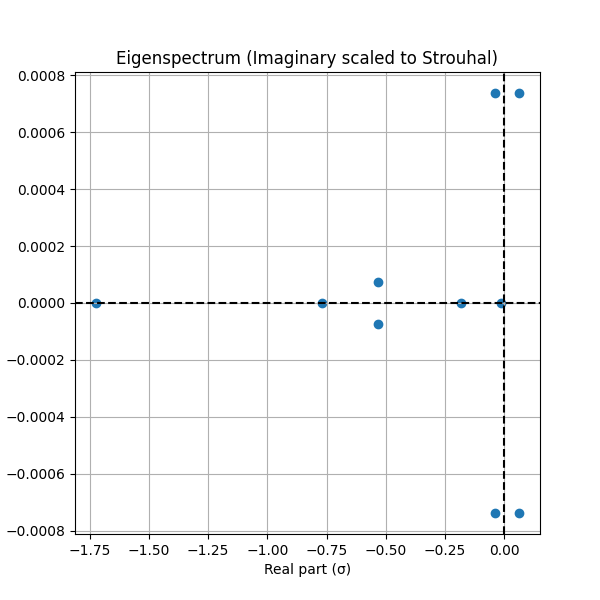

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

L = 1.0
U_ref = 171.25

sigma = np.real(vals)
omega = np.imag(vals)

St = (omega * L) / (2 * np.pi * U_ref)
print(St)
plt.figure(figsize=(6,6))
plt.scatter(sigma, St)
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')

plt.xlabel("Real part (σ)")
plt.ylabel("Strouhal number (St)")
plt.title("Eigenspectrum (Imaginary scaled to Strouhal)")
plt.grid(True)
plt.show()


In [ ]:
# for debug
indexi = 0
node_i= indexi + 1 # define node i 

U_i = U[indexi,:] # U_i conservative variable vector for node i 
neighbours_j = j_nodes[i_nodes == node_i] # neighbours node j 
U_j_all = U[neighbours_j - 1 ,:] # U conservative variable vectors for all neighbouring nodes j (number_of_neighbours , 5)
V_i = V[indexi] # cell volume for node i
A_ij_all = A[i_nodes == node_i, :] # Aij area normal vector for all neighbouring nodes j (number_of_neighbours , 3)
print(f"for node {node_i}: ")

print("node i = ", node_i)
print("U at node i: ", U_i)
print("U at node j(s): ", U_j_all)
print("cell volume at node i: ",V_i)
print("Aij(s): ",A_ij_all)

# check densities and nodes right here
print(f"density at node i = {node_i}: ",rstfile.rho[indexi])
print("correponding node j(s):",neighbours_j)
print(f"density at node j(s) = ",rstfile.rho[neighbours_j - 1 ])


for node 1: 
node i =  1
U at node i:  [ 1.0483108e+00  2.3677547e+02 -8.3471115e+01 -2.6376203e-01
  2.4573844e+05]
U at node j(s):  [[ 1.0154847e+00  2.4944295e+02 -6.5536743e+01 -3.1640431e-01
   2.3906170e+05]
 [ 1.0062773e+00  2.4784473e+02 -8.2285912e+01 -4.5021662e-01
   2.3734559e+05]
 [ 9.8969412e-01  2.5307585e+02 -7.3119965e+01 -4.3625104e-01
   2.3377534e+05]
 [ 1.0061597e+00  2.4558727e+02 -7.8802803e+01 -1.1078330e-01
   2.3657405e+05]
 [ 1.0468251e+00  2.3919551e+02 -7.1313805e+01  6.4009927e-02
   2.4505211e+05]
 [ 1.0462482e+00  2.4287595e+02 -7.3377548e+01 -2.2763562e-01
   2.4589573e+05]
 [ 1.0875689e+00  2.2463103e+02 -9.0974648e+01 -2.9742348e-01
   2.5405442e+05]
 [ 1.0446885e+00  2.3480092e+02 -9.6564796e+01 -1.5245427e-01
   2.4526611e+05]
 [ 1.0978175e+00  2.2882129e+02 -7.4439903e+01 -2.0438257e-01
   2.5636381e+05]
 [ 1.0254211e+00  2.4132739e+02 -8.8806854e+01 -3.8769174e-01
   2.4106658e+05]
 [ 1.0629680e+00  2.2669194e+02 -1.0045373e+02 -1.8589437e-01
   2